# SAMGeo

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/giswqs/geog-312/blob/main/book/geospatial/samgeo.ipynb)

## Install dependencies

Uncomment and run the following cell to install the required dependencies.

In [1]:
!uv venv
!source .venv/bin/activate
!uv pip install --system segment-geospatial groundingdino-py leafmap localtileserver

Se han truncado las últimas 5000 líneas del flujo de salida.
⠇ Preparing packages... (48/54)
nvidia-cusolver-cu12 ------------------------------ 110.52 MiB/122.01 MiB
nvidia-cusparse-cu12 ------------------------------ 111.06 MiB/197.84 MiB
nvidia-cufft-cu12 ------------------------------ 110.90 MiB/201.66 MiB
nvidia-cublas-cu12 ------------------------------ 108.97 MiB/346.60 MiB
   Building sam2==1.1.0
      Built antlr4-python3-runtime==4.9.3
      Built groundingdino-py==0.4.0
      Built iopath==0.1.10
⠇ Preparing packages... (48/54)
nvidia-cusolver-cu12 ------------------------------ 111.08 MiB/122.01 MiB
nvidia-cusparse-cu12 ------------------------------ 111.62 MiB/197.84 MiB
nvidia-cufft-cu12 ------------------------------ 111.04 MiB/201.66 MiB
nvidia-cublas-cu12 ------------------------------ 109.14 MiB/346.60 MiB
   Building sam2==1.1.0
      Built antlr4-python3-runtime==4.9.3
      Built groundingdino-py==0.4.0
      Built iopath==0.1.10
⠇ Preparing packages... (48/54)
nvi

## Import libraries

In [ ]:
%pip list

#!source .venv/bin/activate
#import leafmap
#from samgeo import SamGeo
#from samgeo.text_sam import LangSAM

Package                            Version
---------------------------------- -------------------
absl-py                            1.4.0
accelerate                         1.3.0
addict                             2.4.0
affine                             2.4.0
aiohappyeyeballs                   2.4.6
aiohttp                            3.11.12
aiosignal                          1.3.2
alabaster                          1.0.0
albucore                           0.0.23
albumentations                     2.0.4
ale-py                             0.10.1
altair                             5.5.0
aniso8601                          10.0.0
annotated-types                    0.7.0
antlr4-python3-runtime             4.9.3
anyio                              3.7.1
anywidget                          0.9.13
argon2-cffi                        23.1.0
argon2-cffi-bindings               21.2.0
array_record                       0.6.0
arviz                              0.20.0
astropy                         

## Download sample data

### Create an interactive map

In [ ]:
import leafmap
m = leafmap.Map(center=[41.32180, 2.14312], zoom=15, height=700)
m.add_basemap("SATELLITE")
m

Map(center=[41.3218, 2.14312], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zo…

Pan and zoom the map to select the area of interest. Use the draw tools to draw a polygon or rectangle on the map

In [ ]:
if m.user_roi_bounds() is not None:
    bbox = m.user_roi_bounds()
else:
    bbox = [-86.9167, 40.4262, -86.9105, 40.4289]

### Download map tiles

Download maps tiles and mosaic them into a single GeoTIFF file

In [13]:
import leafmap
image = "tile_16384_grid_0_0.tif"
image2= "tile_16384_grid_0_1.tif"

Specify the basemap as the source.

In [ ]:
leafmap.map_tiles_to_geotiff(
    output=image, bbox=bbox, zoom=18, source="Satellite", overwrite=True
)

You can also use your own image. Uncomment and run the following cell to use your own image.

In [ ]:
# image = '/path/to/your/own/image.tif'

Display the downloaded image on the map.

In [14]:
m.layers[-1].visible = False  # turn off the basemap
m.add_raster(image, layer_name="Image")
m

Map(bottom=3135497.0, center=[41.324022, 2.1326140000000002], controls=(ZoomControl(options=['position', 'zoom…

## Automatic mask generation

### Initialize SAM class

In [17]:
import SamGeo
sam = SamGeo(
    model_type="vit_h",
    sam_kwargs=None,
)

ModuleNotFoundError: No module named 'SamGeo'

### Automatic mask generation

Segment the image and save the results to a GeoTIFF file. Set `unique=True` to assign a unique ID to each object.

In [16]:
sam.generate(image, output="masks.tif", foreground=True, unique=True)

NameError: name 'sam' is not defined

In [ ]:
sam.show_masks(cmap="binary_r")

![](https://i.imgur.com/kWqLVuL.png)

Show the object annotations (objects with random color) on the map.

In [ ]:
sam.show_anns(axis="off", alpha=1, output="annotations.tif")

![](https://i.imgur.com/J6Ie0Zj.png)

Compare images with a slider.

In [ ]:
leafmap.image_comparison(
    "result_1024_grid_2_122.tif",
    "annotations.tif",
    label1="Satellite Image",
    label2="Image Segmentation",
)

![](https://i.imgur.com/cm4QyaR.png)

Add image to the map.

In [ ]:
m.add_raster("annotations.tif", opacity=0.5, layer_name="Masks")
m

![](https://i.imgur.com/Y6EaGVN.png)

Convert the object annotations to vector format, such as GeoPackage, Shapefile, or GeoJSON.

### Automatic mask generation options

There are several tunable parameters in automatic mask generation that control how densely points are sampled and what the thresholds are for removing low quality or duplicate masks. Additionally, generation can be automatically run on crops of the image to get improved performance on smaller objects, and post-processing can remove stray pixels and holes. Here is an example configuration that samples more masks:

In [ ]:
sam_kwargs = {
    "points_per_side": 32,
    "pred_iou_thresh": 0.86,
    "stability_score_thresh": 0.92,
    "crop_n_layers": 1,
    "crop_n_points_downscale_factor": 2,
    "min_mask_region_area": 100,
}

In [ ]:
sam = SamGeo(
    model_type="vit_h",
    sam_kwargs=sam_kwargs,
)

## Use points as input prompts

### Initialize SAM class

Set `automatic=False` to disable the `SamAutomaticMaskGenerator` and enable the `SamPredictor`.

In [ ]:
m = leafmap.Map(center=[40.427495, -86.913638], zoom=18, height=700)
image ="image.tif"
m.add_raster(image, layer_name="Image")
m

In [18]:
from samgeo import SamGeo
sam = SamGeo(
    model_type="vit_h",
    automatic=False,
    sam_kwargs=None,
)

Model checkpoint for vit_h not found.


Downloading...
From: https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth
To: /root/.cache/torch/hub/checkpoints/sam_vit_h_4b8939.pth
100%|██████████| 2.56G/2.56G [00:19<00:00, 131MB/s]


Specify the image to segment.

In [19]:
sam.set_image(image)

In [20]:
point_coords = [[427394.87, 4574948.35]]
sam.predict(point_coords, point_labels=1, point_crs="EPSG:25831", output="mask1.tif")
m.add_raster("mask1.tif", layer_name="Mask1", nodata=0, cmap="Blues", opacity=1)
m

Output hidden; open in https://colab.research.google.com to view.

In [21]:
sam.raster_to_vector('mask1.tif','rotonda.geojson')

In [27]:
images=['tile_1024_grid_11_8','tile_1024_grid_11_7','tile_1024_grid_10_8','tile_1024_grid_10_7']

In [33]:
from samgeo import SamGeo2
sam = SamGeo2(
    model_id="sam2-hiera-large",
    automatic=False,
)

sam2_hiera_large.pt:   0%|          | 0.00/898M [00:00<?, ?B/s]

In [36]:
!uv pip install geopandas

Resolved 12 packages in 99ms
⠙ Preparing packages... (0/12)
⠙ Preparing packages... (0/12)
certifi    ------------------------------     0 B/162.49 KiB
⠙ Preparing packages... (0/12)
certifi    ------------------------------     0 B/162.49 KiB
python-dateutil ------------------------------     0 B/224.50 KiB
⠙ Preparing packages... (0/12)
packaging  ------------------------------     0 B/63.92 KiB
certifi    ------------------------------     0 B/162.49 KiB
python-dateutil ------------------------------     0 B/224.50 KiB
⠙ Preparing packages... (0/12)
six        ------------------------------     0 B/10.79 KiB
packaging  ------------------------------     0 B/63.92 KiB
certifi    ------------------------------     0 B/162.49 KiB
python-dateutil ------------------------------     0 B/224.50 KiB
⠙ Preparing packages... (0/12)
six        ------------------------------     0 B/10.79 KiB
packaging  ------------------------------     0 B/63.92 KiB
certifi    ------------------------------ 1

In [ ]:
import geopandas as gpd
gdf=gpd.read_file('rotonda.geojson')
coordenadas=list(gdf['geometry'][0].exterior.coords)
coordenadas

[(427393.6, 4574963.2),
 (427393.6, 4574962.399999999),
 (427387.2, 4574962.399999999),
 (427387.2, 4574961.6),
 (427384.8, 4574961.6),
 (427384.8, 4574960.8),
 (427383.2, 4574960.8),
 (427383.2, 4574960.0),
 (427382.4, 4574960.0),
 (427382.4, 4574959.2),
 (427380.8, 4574959.2),
 (427380.8, 4574958.399999999),
 (427380.0, 4574958.399999999),
 (427380.0, 4574957.6),
 (427379.2, 4574957.6),
 (427379.2, 4574956.8),
 (427378.4, 4574956.8),
 (427378.4, 4574956.0),
 (427377.6, 4574956.0),
 (427377.6, 4574955.2),
 (427376.0, 4574955.2),
 (427376.0, 4574954.399999999),
 (427375.2, 4574954.399999999),
 (427375.2, 4574952.8),
 (427374.4, 4574952.8),
 (427374.4, 4574952.0),
 (427373.6, 4574952.0),
 (427373.6, 4574951.2),
 (427372.8, 4574951.2),
 (427372.8, 4574950.399999999),
 (427372.0, 4574950.399999999),
 (427372.0, 4574949.6),
 (427371.2, 4574949.6),
 (427371.2, 4574948.0),
 (427370.4, 4574948.0),
 (427370.4, 4574947.2),
 (427369.6, 4574947.2),
 (427369.6, 4574945.6),
 (427368.8, 4574945.6),


In [50]:
m=leafmap.Map()
for im in images:
  #m.add_raster(im+'.tif',layer_name=im)
  sam.set_image(im+'.tif')
  coordenadas_in=
  sam.predict_by_points(
    point_coords_batch=coordenadas,
    point_crs="EPSG:25831",
    output=f"mask_{im}.tif",
    dtype="uint8",
    multimask_output=False,
  )
  m.add_raster(f"mask_{im}.tif", layer_name=f"Mask{im}", nodata=0, cmap="Blues", opacity=1)
m

Some coordinates are out of the image boundary.


AssertionError: This function should only be used when in batched mode

In [26]:
for im in images:
  sam.raster_to_vector('mask_'+im,im.split('.')[0]+'_rotonda.geojson')

RasterioIOError: mask_tile_1024_grid_11_8.tif: No such file or directory

### Image segmentation with input points

A single point can be used to segment an object. The point can be specified as a tuple of (x, y), such as (col, row) or (lon, lat). The points can also be specified as a file path to a vector dataset. For non (col, row) input points, specify the `point_crs` parameter, which will automatically transform the points to the image column and row coordinates.

Try a single point input:

![](https://i.imgur.com/zUMLUsn.png)

Try multiple points input:

In [ ]:
point_coords = [
    [-86.913162, 40.427157],
    [-86.913425, 40.427157],
    [-86.91343, 40.427721],
    [-86.913012, 40.427741],
]
sam.predict(point_coords, point_labels=1, point_crs="EPSG:4326", output="mask2.tif")
m.add_raster("mask2.tif", layer_name="Mask2", nodata=0, cmap="Greens", opacity=1)
m

![](https://i.imgur.com/zUMLUsn.png)

### Interactive segmentation

Display the interactive map and use the marker tool to draw points on the map. Then click on the `Segment` button to segment the objects. The results will be added to the map automatically. Click on the `Reset` button to clear the points and the results.

In [22]:
m = sam.show_map()
m

Output hidden; open in https://colab.research.google.com to view.

![](https://i.imgur.com/3W7JGqP.png)

## Bounding box input prompts

### Create an interactive map

In [ ]:
m = leafmap.Map(center=[40.427495, -86.913638], zoom=18, height=700)
image = "image.tif"
m.add_raster(image, layer_name="Image")
m

In [ ]:
sam = SamGeo(
    model_type="vit_h",
    automatic=False,
    sam_kwargs=None,
)

Specify the image to segment.

In [ ]:
sam.set_image(image)

### Create bounding boxes

If no rectangles are drawn, the default bounding boxes will be used as follows:

In [ ]:
if m.user_rois is not None:
    boxes = m.user_rois
else:
    boxes = [
        [-86.913654, 40.426967, -86.912774, 40.427881],
        [-86.914780, 40.426256, -86.913997, 40.426852],
        [-86.913632, 40.426215, -86.912581, 40.426820],
    ]

## Segment the image

Use the `predict()` method to segment the image with specified bounding boxes. The `boxes` parameter accepts a list of bounding box coordinates in the format of [[left, bottom, right, top], [left, bottom, right, top], ...], a GeoJSON dictionary, or a file path to a GeoJSON file.

In [ ]:
sam.predict(boxes=boxes, point_crs="EPSG:4326", output="mask.tif", dtype="uint8")

## Display the result

Add the segmented image to the map.

In [ ]:
m.add_raster("mask.tif", cmap="viridis", nodata=0, opacity=0.6, layer_name="Mask")
m

![](https://i.imgur.com/9y31xUH.png)

## Text promots

### Initialize LangSAM class

The initialization of the LangSAM class might take a few minutes. The initialization downloads the model weights and sets up the model for inference.

In [ ]:
!pip install uv
!uv venv

!uv pip install --system segment-geospatial leafmap
!uv pip install --system segment-geospatial groundingdino-py leafmap localtileserver


Se han truncado las últimas 5000 líneas del flujo de salida.
      Built ri==0.1
⠧ Preparing packages... (45/51)
nvidia-cusolver-cu12 ------------------------------ 120.64 MiB/122.01 MiB
nvidia-cusparse-cu12 ------------------------------ 121.39 MiB/197.84 MiB
nvidia-cufft-cu12 ------------------------------ 121.36 MiB/201.66 MiB
nvidia-cublas-cu12 ------------------------------ 120.96 MiB/346.60 MiB
   Building sam2==1.1.0
      Built antlr4-python3-runtime==4.9.3
      Built iopath==0.1.10
      Built ri==0.1
⠇ Preparing packages... (45/51)
nvidia-cusolver-cu12 ------------------------------ 120.64 MiB/122.01 MiB
nvidia-cusparse-cu12 ------------------------------ 121.87 MiB/197.84 MiB
nvidia-cufft-cu12 ------------------------------ 121.53 MiB/201.66 MiB
nvidia-cublas-cu12 ------------------------------ 121.75 MiB/346.60 MiB
   Building sam2==1.1.0
      Built antlr4-python3-runtime==4.9.3
      Built iopath==0.1.10
      Built ri==0.1
⠇ Preparing packages... (45/51)
nvidia-cusolver

NameError: name 'leafmap' is not defined

In [ ]:
import leafmap
image='result_1024_grid_2_122.tif'
m = leafmap.Map(center=[40.427495, -86.913638], zoom=18, height=700)

m.add_raster(image, layer_name="Image")
m

Map(center=[41.3826765, 2.18339], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', …

In [ ]:
from samgeo import SamGeo
from samgeo.text_sam import LangSAM
sam = LangSAM()

GroundingDINO_SwinB.cfg.py:   0%|          | 0.00/1.01k [00:00<?, ?B/s]

final text_encoder_type: bert-base-uncased


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

groundingdino_swinb_cogcoor.pth:   0%|          | 0.00/938M [00:00<?, ?B/s]

Downloading: "https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth" to /root/.cache/torch/hub/checkpoints/sam_vit_h_4b8939.pth
100%|██████████| 2.39G/2.39G [00:25<00:00, 101MB/s] 


### Specify text prompts

In [ ]:
text_prompt = "roundabout"

### Segment the image

Part of the model prediction includes setting appropriate thresholds for object detection and text association with the detected objects. These threshold values range from 0 to 1 and are set while calling the predict method of the LangSAM class.

`box_threshold`: This value is used for object detection in the image. A higher value makes the model more selective, identifying only the most confident object instances, leading to fewer overall detections. A lower value, conversely, makes the model more tolerant, leading to increased detections, including potentially less confident ones.

`text_threshold`: This value is used to associate the detected objects with the provided text prompt. A higher value requires a stronger association between the object and the text prompt, leading to more precise but potentially fewer associations. A lower value allows for looser associations, which could increase the number of associations but also introduce less precise matches.

Remember to test different threshold values on your specific data. The optimal threshold can vary depending on the quality and nature of your images, as well as the specificity of your text prompts. Make sure to choose a balance that suits your requirements, whether that's precision or recall.

In [ ]:
sam.predict(image, text_prompt, box_threshold=0.24, text_threshold=0.2)

### Visualize the results

Show the result with bounding boxes on the map.

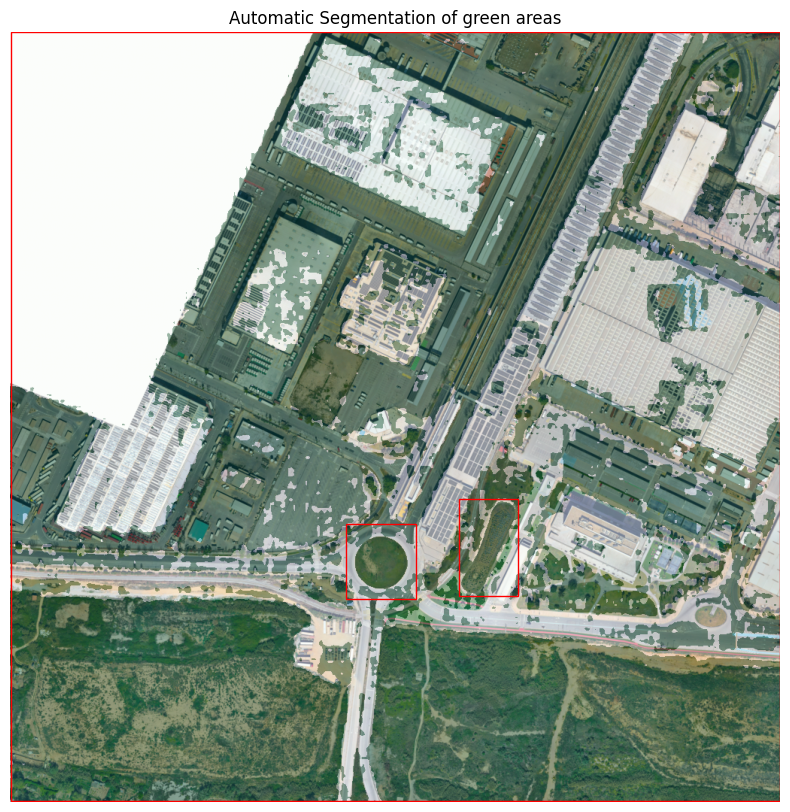

In [ ]:
sam.show_anns(
    cmap="Greens",
    box_color="red",
    title="Automatic Segmentation of green areas",
    blend=True,
)

![](https://i.imgur.com/qRcy16Z.png)

Show the result without bounding boxes on the map.

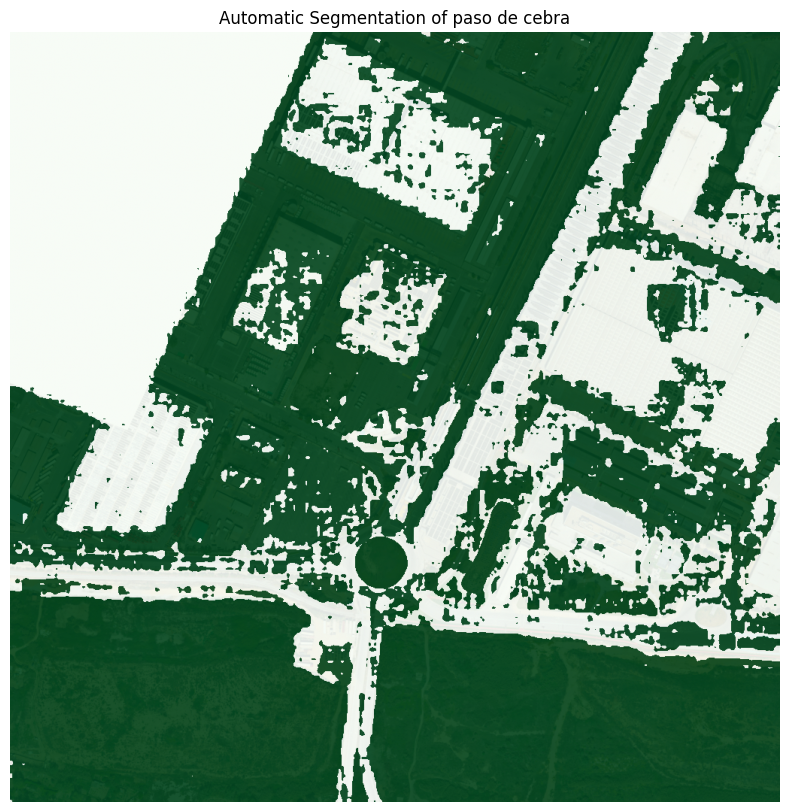

In [ ]:
sam.show_anns(
    cmap="Greens",
    add_boxes=False,
    alpha=0.9,
    title="Automatic Segmentation of paso de cebra",
)

![](https://i.imgur.com/TvqGByH.png)

Show the result as a grayscale image.

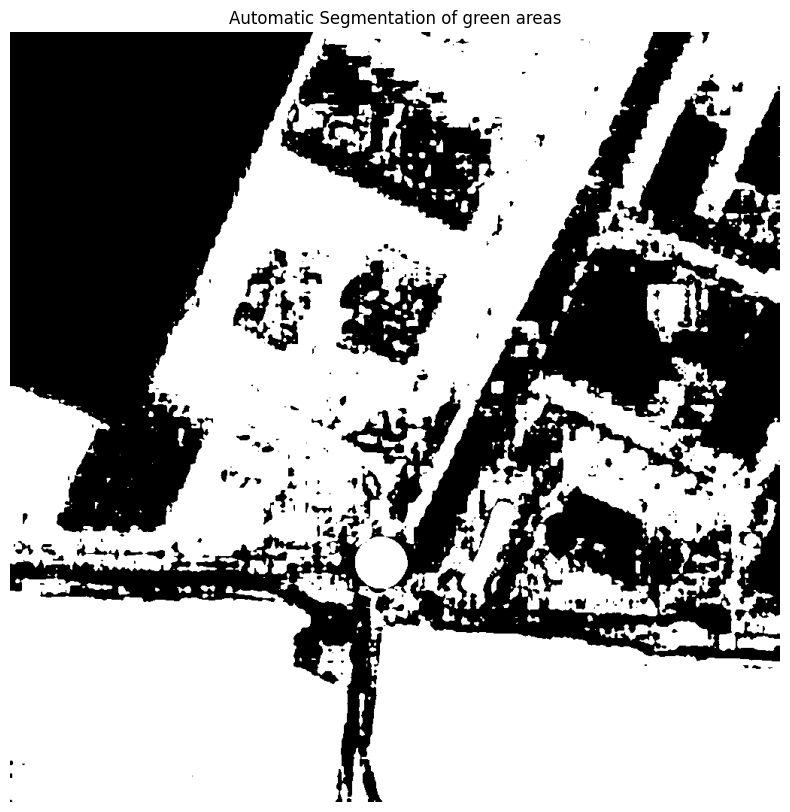

In [ ]:
sam.show_anns(
    cmap="Greys_r",
    add_boxes=False,
    alpha=1,
    title="Automatic Segmentation of green areas",
    blend=False,
    output="t.tif",
)

Convert the result to a vector format.

In [ ]:
sam.raster_to_vector("t.tif", "t.geojson")

Show the results on the interactive map.

In [ ]:
m.add_raster("t.tif", layer_name="ZONAS_LLERA", palette="Greens", opacity=0.5, nodata=0)
style = {
    "color": "#3388ff",
    "weight": 2,
    "fillColor": "#7c4185",
    "fillOpacity": 0.5,
}
m.add_vector("t.geojson", layer_name="Vector", style=style)
m

![](https://i.imgur.com/WDQgECD.png)

### Interactive segmentation

In [ ]:
sam.show_map()

Map(center=[41.3464225, 2.144676], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title',…

![](https://i.imgur.com/Zn7Dwty.png)